# M148 Fall 2024 Final Project 
Team: Ashley Le, Chelsea Lai, Ginny Ghang, Hannah Kendall, and Rubelina Riley

## The following notebook contains the consolidated code for our final project. The code is divided into the below sections. Each section is designed to be able to run independently of the others, thus enabling customized exploration and analysis of the data.
1. Data Preprocessing, Cleaning and Exploratory Data Analysis (EDA)
2. Linear Regression
3. Logistic Regression
4. Classification
5. Principal Component Analysis (PCA)
6. Clustering
7. Neural Networks


In [ ]:
# Import Libraries 
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn import metrics
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.linear_model import LinearRegression, LogisticRegression, Ridge, Lasso
from sklego.linear_model import LADRegression
from sklearn.model_selection import cross_val_score, cross_validate
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import SequentialFeatureSelector
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler



pd.set_option('display.max_columns', None)
pd.options.display.max_colwidth = 500
pd.options.display.max_rows = 100

# 1. Data Preprocessing, Cleaning, and Exploratory Data Analysis

In [2]:
# Import data
spotify_data_orig = pd.read_csv('spotify_dataset.csv')

# Print out column name: 
spotify_data_orig.columns

Index(['Unnamed: 0', 'track_id', 'artists', 'album_name', 'track_name',
       'popularity', 'duration_ms', 'explicit', 'danceability', 'energy',
       'key', 'loudness', 'mode', 'speechiness', 'acousticness',
       'instrumentalness', 'liveness', 'valence', 'tempo', 'time_signature',
       'track_genre'],
      dtype='object')

Valid ranges for each predictor variable:
* popularity: 0 - 100
* duration_ms: >0 
* danceability: 0 - 1
* energy: 0 - 1 
* key: 0 - 11 
* loudness: -49.53 - 4.53 
* mode: 0 or 1
* speechiness: 0 - 1
* acousticness: 0 - 1 
* instrumentalness: 0 - 1
* liveness: 0 - 1
* valence: 0 - 1 
* tempo: 0 - 243 
* time_signature: 3 - 7

In [3]:
# Remove duplicates and missing values
spotify_nona = spotify_data_orig.dropna()
spotify_data_unique = spotify_nona.drop_duplicates("track_id", keep="first").drop(columns=["Unnamed: 0"])

# Check unique IDs
nrows = spotify_data_unique.shape[0]
nunique = spotify_data_unique['track_id'].nunique()

assert nrows == nunique, "There are duplicate track IDs"

# Check summaries of each row
spotify_data_unique.select_dtypes('number').describe()

,popularity,duration_ms,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
count,89740.000000,8.974000e+04,89740.000000,89740.000000,89740.000000,89740.000000,89740.000000,89740.000000,89740.000000,89740.000000,89740.000000,89740.000000,89740.000000,89740.000000
mean,33.198808,2.291444e+05,0.562166,0.634458,5.283530,-8.498994,0.636973,0.087442,0.328285,0.173415,0.216971,0.469474,122.058134,3.897426
std,20.580640,1.129458e+05,0.176692,0.256606,3.559912,5.221518,0.480875,0.113278,0.338321,0.323849,0.194885,0.262864,30.117651,0.453437
min,0.000000,8.586000e+03,0.000000,0.000000,0.000000,-49.531000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,19.000000,1.730400e+05,0.450000,0.457000,2.000000,-10.322250,0.000000,0.036000,0.017100,0.000000,0.098200,0.249000,99.262750,4.000000
50%,33.000000,2.132955e+05,0.576000,0.676000,5.000000,-7.185000,1.000000,0.048900,0.188000,0.000058,0.132000,0.457000,122.013000,4.000000
75%,49.000000,2.642930e+05,0.692000,0.853000,8.000000,-5.108000,1.000000,0.085900,0.625000,0.097625,0.279000,0.682000,140.077000,4.000000
max,100.000000,5.237295e+06,0.985000,1.000000,11.000000,4.532000,1.000000,0.965000,0.996000,1.000000,1.000000,0.995000,243.372000,5.000000


In [4]:
# 1136 rows (~1%) with invalid time signatures.
# Removing these rows will not significantly impact the size of our data, so we remove
rows_invalid_time_sig = spotify_data_unique[spotify_data_unique['time_signature'] < 3]
pct_invalid_time_sig = len(rows_invalid_time_sig)/len(spotify_data_unique.index)
valid_spotify_data = spotify_data_unique[spotify_data_unique['time_signature'] >= 3]
print ("Percent of invalid time signature: " + str(pct_invalid_time_sig))

spotify_data_cleaned = spotify_data_unique[spotify_data_unique['time_signature'] >= 3]

# Save cleaned data to a new file for easy future access
with pd.ExcelWriter('clean_data.xlsx') as writer:
    spotify_data_cleaned.to_excel(writer, sheet_name='Clean', index=False)

Percent of invalid time sig: 0.011232449297971918


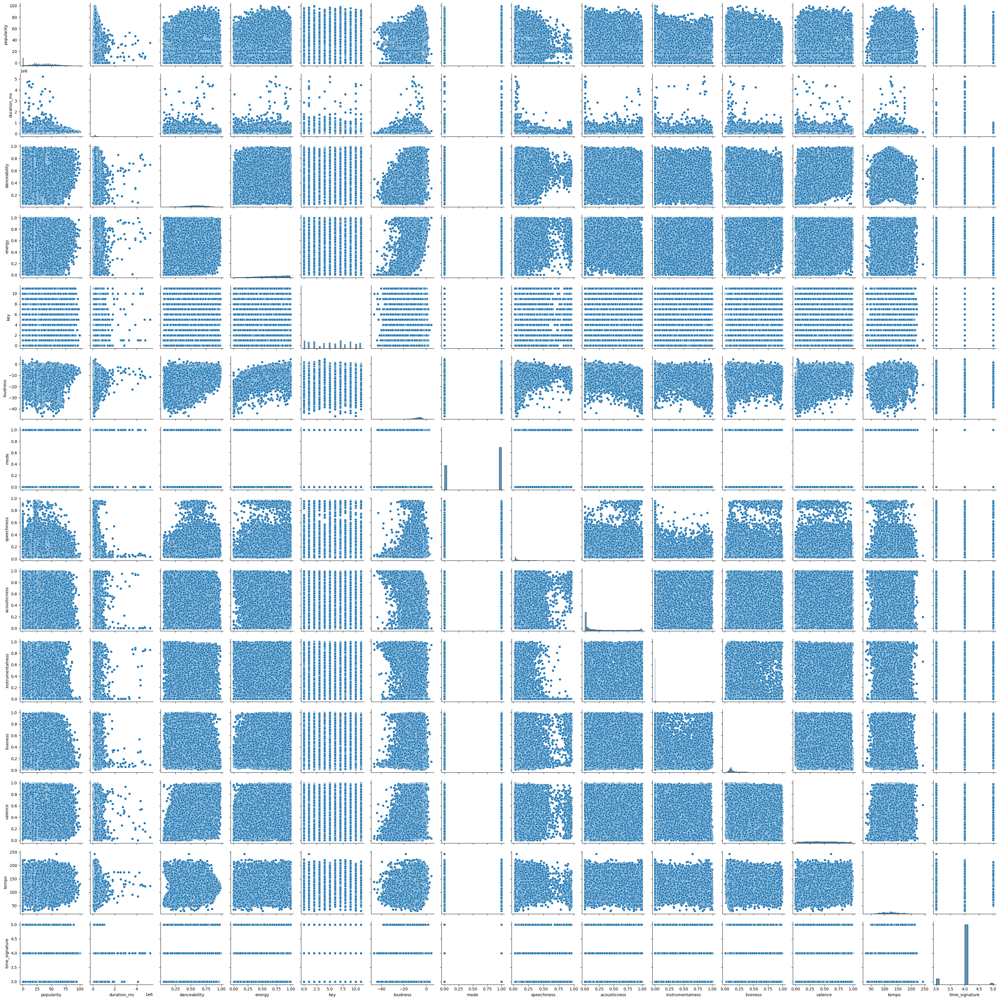

In [6]:
# Visualize scatterplot across all dependent variables
spotify_data_cleaned_dependent = spotify_data_cleaned.drop(columns = ["track_id", "artists","track_name", "track_genre", "explicit"])
sns.pairplot(data=spotify_data_cleaned_dependent)
plt.show()

In [7]:
# Select only numeric columns
spotify_data_cleaned_numeric = spotify_data_cleaned_dependent.select_dtypes(include=['float64', 'int64'])

# Compute the correlation matrix
Correlation_Matrix = spotify_data_cleaned_numeric.corr()

# Display the correlation matrix
print(Correlation_Matrix)

                  popularity  duration_ms  danceability    energy       key  \
popularity          1.000000    -0.024766      0.063853  0.012642  0.002463   
duration_ms        -0.024766     1.000000     -0.070639  0.062452  0.011082   
danceability        0.063853    -0.070639      1.000000  0.129525  0.034687   
energy              0.012642     0.062452      0.129525  1.000000  0.045983   
key                 0.002463     0.011082      0.034687  0.045983  1.000000   
loudness            0.073175    -0.005840      0.254835  0.759726  0.035812   
mode               -0.016403    -0.040011     -0.063504 -0.074680 -0.142105   
speechiness        -0.045647    -0.060111      0.107686  0.140145  0.018360   
acousticness       -0.036838    -0.108605     -0.172064 -0.733844 -0.044916   
instrumentalness   -0.128763     0.123329     -0.182924 -0.175411 -0.003492   
liveness           -0.013301     0.011639     -0.127366  0.194528 -0.003012   
valence            -0.012574    -0.152863      0.484

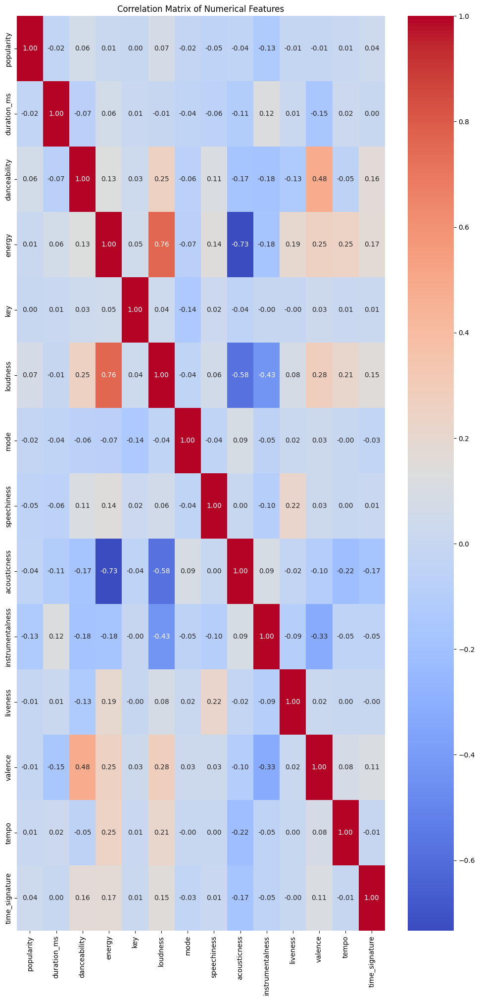

loudness            1.000000
energy              0.759726
valence             0.279826
danceability        0.254835
tempo               0.213648
time_signature      0.148100
liveness            0.084208
popularity          0.073175
speechiness         0.055219
key                 0.035812
duration_ms        -0.005840
mode               -0.037504
instrumentalness   -0.430668
acousticness       -0.582554
Name: loudness, dtype: float64
loudness            1.000000
energy              0.759726
valence             0.279826
danceability        0.254835
tempo               0.213648
time_signature      0.148100
liveness            0.084208
popularity          0.073175
speechiness         0.055219
key                 0.035812
duration_ms        -0.005840
mode               -0.037504
instrumentalness   -0.430668
acousticness       -0.582554
Name: loudness, dtype: float64


In [8]:
plt.figure(figsize=(12, 24))
sns.heatmap(Correlation_Matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix of Numerical Features')
plt.show()

# Check specific correlations with 'popularity'
corr_with_popularity = Correlation_Matrix['loudness'].sort_values(ascending=False)

print(corr_with_popularity)
print(Correlation_Matrix['loudness'].sort_values(ascending=False))

2. Linear Regression

In [9]:
spotify_cleaned = pd.read_excel('clean_data.xlsx')

# Check csv for proper loading
spotify_cleaned.columns

Index(['track_id', 'artists', 'album_name', 'track_name', 'popularity',
       'duration_ms', 'explicit', 'danceability', 'energy', 'key', 'loudness',
       'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness',
       'valence', 'tempo', 'time_signature', 'track_genre'],
      dtype='object')

In [10]:
# Print correlations between numeric columns -> only print those that have correlations above 0.2
correlations = spotify_cleaned.corr(numeric_only=True)
correlations[correlations.abs() > 0.2].replace(1, np.nan).dropna(how='all', axis=1).dropna(how='all', axis=0)

,explicit,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo
explicit,NaN,NaN,NaN,NaN,0.325346,NaN,NaN,NaN,NaN,NaN
danceability,NaN,NaN,NaN,0.254835,NaN,NaN,NaN,NaN,0.484892,NaN
energy,NaN,NaN,NaN,0.759726,NaN,-0.733844,NaN,NaN,0.249962,0.247234
loudness,NaN,0.254835,0.759726,NaN,NaN,-0.582554,-0.430668,NaN,0.279826,0.213648
speechiness,0.325346,NaN,NaN,NaN,NaN,NaN,NaN,0.220905,NaN,NaN
acousticness,NaN,NaN,-0.733844,-0.582554,NaN,NaN,NaN,NaN,NaN,-0.217672
instrumentalness,NaN,NaN,NaN,-0.430668,NaN,NaN,NaN,NaN,-0.325794,NaN
liveness,NaN,NaN,NaN,NaN,0.220905,NaN,NaN,NaN,NaN,NaN
valence,NaN,0.484892,0.249962,0.279826,NaN,NaN,-0.325794,NaN,NaN,NaN
tempo,NaN,NaN,0.247234,0.213648,NaN,-0.217672,NaN,NaN,NaN,NaN


We chose loudness as our response variable because the correlation matrix shows that it has the highest correlation with the highest number of other variables. We did not use a function to select oit predictor variables for this check in

In [ ]:
# Split data into testing, validation, and training sets
# 60% training, 20% validation, 20% testing

training_data, validation_data = train_test_split(spotify_cleaned, test_size=0.2, random_state=42, stratify=spotify_cleaned["track_genre"])

In [12]:
# Fit a LAD regression model to the training data using the following variables: instrumentalness, speechiness, energy, valence, danceability, acousticness
# We chose these variables because they have the highest correlation with loudness, our response variable

vars = ["instrumentalness", "energy", "valence", "danceability", "acousticness"]
response = "loudness"
lad_fit = LADRegression()
lad_fit.fit(training_data[vars], y=training_data[response])

LADRegression()

In [13]:
# For single predictor variable only
fig = px.scatter(training_data, x=vars[0], y=response)
fig.add_trace(go.Scatter(x=training_data[vars[0]], y=lad_fit.intercept_ + lad_fit.coef_[0] * training_data[vars[0]], mode='lines', name='LAD Fit'))

In [15]:
# Fit an LS regression model to the training data using the following variables: instrumentalness, speechiness, energy, valence, danceability, acousticness
ls_fit = LinearRegression()
ls_fit.fit(X=training_data[vars], y=training_data[response])

LinearRegression()

In [16]:
# Scatter plot for single predictor variable only
fig = px.scatter(training_data, x=vars[0], y=response)
fig.add_trace(go.Scatter(x=training_data[vars[0]], y=ls_fit.intercept_ + ls_fit.coef_[0] * training_data[vars[0]], mode='lines', name='LS Fit'))

In [ ]:
# Find the residuals between the true values and the predicted values for the training and validation sets

pred_train_df = pd.DataFrame({'true': training_data[response], 'ls_pred': ls_fit.predict(training_data[vars]), 'lad_pred': lad_fit.predict(training_data[vars])})

pred_val_df = pd.DataFrame({'true': validation_data[response], 'ls_pred': ls_fit.predict(validation_data[vars]), 'lad_pred': lad_fit.predict(validation_data[vars])})

In [ ]:
# calculate the rMSE, MAE, MAD, correlation, and R2 of the true price with the LS and LAD predictions
print('Training LS rMSE:', np.sqrt(mean_squared_error(pred_train_df['true'], pred_train_df['ls_pred'])))
print('Training LS MAE:', mean_absolute_error(pred_train_df['true'], pred_train_df['ls_pred']))
print('Training LS MAD:', np.median(np.abs(pred_train_df['true'] - pred_train_df['ls_pred'])))
print('Training LS correlation:', np.corrcoef(pred_train_df['true'], pred_train_df['ls_pred'])[0, 1])
print('Training LS R2:', r2_score(pred_train_df['true'], pred_train_df['ls_pred']))

print('Training LAD rMSE:', np.sqrt(mean_squared_error(pred_train_df['true'], pred_train_df['lad_pred'])))
print('Training LAD MAE:', mean_absolute_error(pred_train_df['true'], pred_train_df['lad_pred']))
print('Training LAD MAD:', np.median(np.abs(pred_train_df['true'] - pred_train_df['lad_pred'])))
print('Training LAD correlation:', np.corrcoef(pred_train_df['true'], pred_train_df['lad_pred'])[0, 1])
print('Training LAD R2:', r2_score(pred_train_df['true'], pred_train_df['lad_pred']))

In [ ]:
# calculate the rMSE, MAE, MAD, correlation, and R2 of the true price with the LS and LAD predictions
print('Training LS rMSE:', np.sqrt(mean_squared_error(pred_val_df['true'], pred_val_df['ls_pred'])))
print('Training LS MAE:', mean_absolute_error(pred_val_df['true'], pred_val_df['ls_pred']))
print('Training LS MAD:', np.median(np.abs(pred_val_df['true'] - pred_val_df['ls_pred'])))
print('Training LS correlation:', np.corrcoef(pred_val_df['true'], pred_val_df['ls_pred'])[0, 1])
print('Training LS R2:', r2_score(pred_val_df['true'], pred_val_df['ls_pred']))

print('Training LAD rMSE:', np.sqrt(mean_squared_error(pred_val_df['true'], pred_val_df['lad_pred'])))
print('Training LAD MAE:', mean_absolute_error(pred_val_df['true'], pred_val_df['lad_pred']))
print('Training LAD MAD:', np.median(np.abs(pred_val_df['true'] - pred_val_df['lad_pred'])))
print('Training LAD correlation:', np.corrcoef(pred_val_df['true'], pred_val_df['lad_pred'])[0, 1])
print('Training LAD R2:', r2_score(pred_val_df['true'], pred_val_df['lad_pred']))

Based on the above values, the LS model is better than the LAD model for predicting loudness based on our manually selected predictor variables since the rMSE is lower, and the R^2 value is higher. This occurs in both the training and validation data set. Since the R^2 values for both the training and validation data sets are very similar, it is unlikely that the model is overfitting. However, since the R^2 values are relatively low, it is likely that the model is not a good fit for the data, and is thus underfitting.

In [ ]:
X = training_data.drop(columns=['loudness'])[vars]
# scale the predictors
X_std = (X - X.mean()) / X.std()
y = training_data['loudness']

In [ ]:
alphas = np.logspace(-1, 6, 100)
ridge_cv_scores = []
# create a for loop to compute the cross-validation score for each alpha value
for alpha in alphas:
    ridge = Ridge(alpha=alpha)
    ridge_cv = cross_validate(estimator=ridge,
                              X=X_std,
                              y=y,
                              cv=10,
                              scoring='neg_root_mean_squared_error')
    ridge_cv_scores.append({'alpha': alpha,
                            'log_alpha': np.log(alpha),
                            'test_mse': -np.mean(ridge_cv['test_score'])})

# convert the cross-validation scores into a data frame
ridge_cv_scores_df = pd.DataFrame(ridge_cv_scores)

In [ ]:
ridge_cv_scores_df

In [ ]:
# define the alpha values to test
alphas = np.logspace(-1, 4, 100)

# create an empty list to store the cross-validation scores
lasso_cv_scores = []

# create a for loop to compute the cross-validation score for each alpha value
for alpha in alphas:
    lasso = Lasso(alpha=alpha)
    lasso_cv = cross_validate(estimator=lasso,
                              X=X_std,
                              y=y,
                              cv=10,
                              scoring='neg_root_mean_squared_error')
    lasso_cv_scores.append({'alpha': alpha,
                            'log_alpha': np.log(alpha),
                            'test_mse': -np.mean(lasso_cv['test_score'])})

# convert the cross-validation scores into a data frame
lasso_cv_scores_df = pd.DataFrame(lasso_cv_scores)

In [ ]:
# identify the value of alpha that minimizes the cross-validation score for ridge
ridge_alpha_min = ridge_cv_scores_df.sort_values(by='test_mse').head(1).alpha.values[0]
# compute the min MSE and the SE of the MSE
mse_se_ridge = ridge_cv_scores_df['test_mse'].std() / np.sqrt(10)
mse_min_ridge = ridge_cv_scores_df['test_mse'].min()


# identify the value of alpha that minimizes the cross-validation score for ridge within 1SE
ridge_alpha_1se = ridge_cv_scores_df[(ridge_cv_scores_df['test_mse'] <= mse_min_ridge + mse_se_ridge) &
                                     (ridge_cv_scores_df['test_mse'] >= mse_min_ridge - mse_se_ridge)].sort_values(by='alpha', ascending=False).head(1).alpha.values[0]


# identify the value of alpha that minimizes the cross-validation score for lasso
lasso_alpha_min = lasso_cv_scores_df.sort_values(by='test_mse').head(1).alpha.values[0]
# compute the min MSE and the SE of the MSE
mse_se_lasso = lasso_cv_scores_df['test_mse'].std() / np.sqrt(10)
mse_min_lasso = lasso_cv_scores_df['test_mse'].min()

# identify the value of alpha that minimizes the cross-validation score for lasso within 1SE
lasso_alpha_1se = lasso_cv_scores_df[(lasso_cv_scores_df['test_mse'] <= mse_min_lasso + mse_se_lasso) &
                                     (lasso_cv_scores_df['test_mse'] >= mse_min_lasso - mse_se_lasso)].sort_values(by='alpha', ascending=False).head(1).alpha.values[0]


In [ ]:
print('Ridge (min): ', ridge_alpha_min)
print('Ridge (1SE): ', ridge_alpha_1se)
print('Lasso (min): ', lasso_alpha_min)
print('Lasso (1SE): ', lasso_alpha_1se)

In [ ]:
# use ridge_alpha_min to fit the ridge regression model
ridge_min_fit = Ridge(alpha=ridge_alpha_min).fit(X=X_std, y=y)
ridge_1se_fit = Ridge(alpha=ridge_alpha_1se).fit(X=X_std, y=y)

# use lasso_alpha_min to fit the lasso regression model
lasso_min_fit = Lasso(alpha=lasso_alpha_min).fit(X=X_std, y=y)
lasso_1se_fit = Lasso(alpha=lasso_alpha_1se).fit(X=X_std, y=y)

print(ridge_min_fit.intercept_, ridge_min_fit.coef_[0], ridge_min_fit.coef_[1], ridge_min_fit.coef_[2], ridge_min_fit.coef_[3], ridge_min_fit.coef_[4])

In [ ]:
pred_train_df_ridge = pd.DataFrame({'true': training_data[response], 'ridge_min_pred': ridge_min_fit.predict(X_std), 'ridge_1se_pred': ridge_1se_fit.predict(X_std)})

X_val = validation_data.drop(columns=['loudness'])[vars]
X_val_std = (X_val - X_val.mean()) / X_val.std()
pred_val_df_ridge = pd.DataFrame({'true': validation_data[response], 'ridge_min_pred': ridge_min_fit.predict(X_val_std), 'ridge_1se_pred': ridge_1se_fit.predict(X_val_std)})


In [ ]:
# calculate the rMSE, MAE, MAD, correlation, and R2 of the true price with the regularized LS and LAD predictions
print('Training Ridge (min) rMSE:', np.sqrt(mean_squared_error(pred_train_df_ridge['true'], pred_train_df_ridge['ridge_min_pred'])))
print('Training Ridge (min) MAE:', mean_absolute_error(pred_train_df_ridge['true'], pred_train_df_ridge['ridge_min_pred']))
print('Training Ridge (min) MAD:', np.median(np.abs(pred_train_df_ridge['true'] - pred_train_df_ridge['ridge_min_pred'])))
print('Training Ridge (min) correlation:', np.corrcoef(pred_train_df_ridge['true'], pred_train_df_ridge['ridge_min_pred'])[0, 1])
print('Training Ridge (min) R2:', r2_score(pred_train_df_ridge['true'], pred_train_df_ridge['ridge_min_pred']))

print('Training Ridge (1SE) rMSE:', np.sqrt(mean_squared_error(pred_train_df_ridge['true'], pred_train_df_ridge['ridge_1se_pred'])))
print('Training Ridge (1SE) MAE:', mean_absolute_error(pred_train_df_ridge['true'], pred_train_df_ridge['ridge_1se_pred']))
print('Training Ridge (1SE) MAD:', np.median(np.abs(pred_train_df_ridge['true'] - pred_train_df_ridge['ridge_1se_pred'])))
print('Training Ridge (1SE) correlation:', np.corrcoef(pred_train_df_ridge['true'], pred_train_df_ridge['ridge_1se_pred'])[0, 1])
print('Training Ridge (1SE) R2:', r2_score(pred_train_df_ridge['true'], pred_train_df_ridge['ridge_1se_pred']))

In [ ]:
print('Validation Ridge (min) rMSE:', np.sqrt(mean_squared_error(pred_val_df_ridge['true'], pred_val_df_ridge['ridge_min_pred'])))
print('Validation Ridge (min) MAE:', mean_absolute_error(pred_val_df_ridge['true'], pred_val_df_ridge['ridge_min_pred']))
print('Validation Ridge (min) MAD:', np.median(np.abs(pred_val_df_ridge['true'] - pred_val_df_ridge['ridge_min_pred'])))
print('Validation Ridge (min) correlation:', np.corrcoef(pred_val_df_ridge['true'], pred_val_df_ridge['ridge_min_pred'])[0, 1])
print('Validation Ridge (min) R2:', r2_score(pred_val_df_ridge['true'], pred_val_df_ridge['ridge_min_pred']))

print('Validation Ridge (1SE) rMSE:', np.sqrt(mean_squared_error(pred_val_df_ridge['true'], pred_val_df_ridge['ridge_1se_pred'])))
print('Validation Ridge (1SE) MAE:', mean_absolute_error(pred_val_df_ridge['true'], pred_val_df_ridge['ridge_1se_pred']))
print('Validation Ridge (1SE) MAD:', np.median(np.abs(pred_val_df_ridge['true'] - pred_val_df_ridge['ridge_1se_pred'])))
print('Validation Ridge (1SE) correlation:', np.corrcoef(pred_val_df_ridge['true'], pred_val_df_ridge['ridge_1se_pred'])[0, 1])
print('Validation Ridge (1SE) R2:', r2_score(pred_val_df_ridge['true'], pred_val_df_ridge['ridge_1se_pred']))


The Ridge model with an optimized alpha value is slightly better than the base LS model for predicting loudness based on our manually selected predictor variables since the rMSE is lower, and the R^2 value is higher. This occurs in both the training and validation data set. Since the R^2 values for both the training and validation data sets are very similar, it is unlikely that the model is overfitting. However, since the R^2 values are relatively low, it is likely that the model is not a good fit for the data, and is thus underfitting.

In [ ]:
pred_train_df_lasso = pd.DataFrame({'true': training_data[response], 'lasso_min_pred': lasso_min_fit.predict(X_std), 'lasso_1se_pred': lasso_1se_fit.predict(X_std)})
pred_val_df_lasso = pd.DataFrame({'true': validation_data[response], 'lasso_min_pred': lasso_min_fit.predict(X_val_std), 'lasso_1se_pred': lasso_1se_fit.predict(X_val_std)})

In [ ]:
print('Training Lasso (min) rMSE:', np.sqrt(mean_squared_error(pred_train_df_lasso['true'], pred_train_df_lasso['lasso_min_pred'])))
print('Training Lasso (min) MAE:', mean_absolute_error(pred_train_df_lasso['true'], pred_train_df_lasso['lasso_min_pred']))
print('Training Lasso (min) MAD:', np.median(np.abs(pred_train_df_lasso['true'] - pred_train_df_lasso['lasso_min_pred'])))
print('Training Lasso (min) correlation:', np.corrcoef(pred_train_df_lasso['true'], pred_train_df_lasso['lasso_min_pred'])[0, 1])
print('Training Lasso (min) R2:', r2_score(pred_train_df_lasso['true'], pred_train_df_lasso['lasso_min_pred']))

print('Training Lasso (1SE) rMSE:', np.sqrt(mean_squared_error(pred_train_df_lasso['true'], pred_train_df_lasso['lasso_1se_pred'])))
print('Training Lasso (1SE) MAE:', mean_absolute_error(pred_train_df_lasso['true'], pred_train_df_lasso['lasso_1se_pred']))
print('Training Lasso (1SE) MAD:', np.median(np.abs(pred_train_df_lasso['true'] - pred_train_df_lasso['lasso_1se_pred'])))
print('Training Lasso (1SE) correlation:', np.corrcoef(pred_train_df_lasso['true'], pred_train_df_lasso['lasso_1se_pred'])[0, 1])
print('Training Lasso (1SE) R2:', r2_score(pred_train_df_lasso['true'], pred_train_df_lasso['lasso_1se_pred']))

In [ ]:
print('Validation Lasso (min) rMSE:', np.sqrt(mean_squared_error(pred_val_df_lasso['true'], pred_val_df_lasso['lasso_min_pred'])))
print('Validation Lasso (min) MAE:', mean_absolute_error(pred_val_df_lasso['true'], pred_val_df_lasso['lasso_min_pred']))
print('Validation Lasso (min) MAD:', np.median(np.abs(pred_val_df_lasso['true'] - pred_val_df_lasso['lasso_min_pred'])))
print('Validation Lasso (min) correlation:', np.corrcoef(pred_val_df_lasso['true'], pred_val_df_lasso['lasso_min_pred'])[0, 1])
print('Validation Lasso (min) R2:', r2_score(pred_val_df_lasso['true'], pred_val_df_lasso['lasso_min_pred']))

print('Validation Lasso (1SE) rMSE:', np.sqrt(mean_squared_error(pred_val_df_lasso['true'], pred_val_df_lasso['lasso_1se_pred'])))
print('Validation Lasso (1SE) MAE:', mean_absolute_error(pred_val_df_lasso['true'], pred_val_df_lasso['lasso_1se_pred']))
print('Validation Lasso (1SE) MAD:', np.median(np.abs(pred_val_df_lasso['true'] - pred_val_df_lasso['lasso_1se_pred'])))
print('Validation Lasso (1SE) correlation:', np.corrcoef(pred_val_df_lasso['true'], pred_val_df_lasso['lasso_1se_pred'])[0, 1])
print('Validation Lasso (1SE) R2:', r2_score(pred_val_df_lasso['true'], pred_val_df_lasso['lasso_1se_pred']))

The Lasso model performed slightly worse than the Ridge model, but performed better than the base LS model for the training data set. However, the Lasso model performed worse than the base LS model for the validation data set. This suggests that the Lasso model is overfitting the training data set, and is not a good fit for the data.

# 3. Logistic Regression

In [ ]:
# Load the cleaned data
logistic_data_orig = pd.read_excel('clean_data.xlsx')

In [ ]:
assert logistic_data_orig.duplicated("track_id").sum() == 0, "There are duplicates track_ids in the data"
logistic_data_orig["track_genre"].value_counts()

Since we will be classifying the data into genres, it is important that each song only has one genre. The above line is used to ensure our data cleaning returned data such that each track only has one genre. The other part of the previous code block is used to see how many of each genre is in the data. This is important as the proportion of each gene will affect the accuracy of the model. If one genre is much more common than the other, the model may be biased towards that genre. For the sake of this check in, we will thus select two genres that are relatively close in number of tracks.

In [ ]:
# Select a subset of the data s.t. we only have 2 classes
# We will use the 'genre' column to create the classes
genre_1 = "chicago-house" # will convert to be the positive class (1)
genre_2 = "cantopop" # will convert to be the negative class (0)

d = {
    genre_1: 1,
    genre_2: 0
}

logistic_data = logistic_data_orig[logistic_data_orig["track_genre"].isin([genre_1, genre_2])]
logistic_data = logistic_data.replace({"track_genre": d}).select_dtypes(include=[np.number]).drop(columns="Unnamed: 0")

# With selected predictor variables:
logistic_data = logistic_data[['danceability', 'acousticness', 'instrumentalness','time_signature', 'track_genre']]

# Split data into training and validation sets - stratified split to ensure same proportion of classes in both sets
logistic_data_train, logistic_data_val = train_test_split(logistic_data, test_size=0.2, random_state=42, stratify=logistic_data["track_genre"])

# Check the proportion of classes in the training and validation sets
prop_zero_train = (logistic_data_train["track_genre"] == 0).sum() / len(logistic_data_train)
prop_zero_val = (logistic_data_val["track_genre"] == 0).sum() / len(logistic_data_val)
assert np.isclose(prop_zero_train, prop_zero_val, atol=0.05), "Proportion of classes in training and validation sets are not the same"

In [ ]:
logistic_data_val

In [ ]:
# Compute logistic regression over entire training data set
lr_all = LogisticRegression(solver='liblinear')
lr_all.fit(X=logistic_data_train.drop(columns="track_genre"), y=logistic_data_train["track_genre"])
lr_all.intercept_, lr_all.coef_

In [ ]:
# Test the model on a subset of all observations in the validation set
X_val = logistic_data_val.drop(columns="track_genre")
y_val = logistic_data_val["track_genre"]

pred_val = pd.DataFrame({"actual": y_val, "predicted": lr_all.predict(X_val), "prob": lr_all.predict_proba(X_val)[:,1]})
# pred_val.replace({1: genre_1, 0: genre_2}, inplace=True)
pred_val

In [ ]:
# Confusion matrix
conf_matrix = metrics.confusion_matrix(y_true=pred_val["actual"].replace({genre_1: 1, genre_2: 0}), y_pred=pred_val["predicted"].replace({genre_1: 1, genre_2: 0}))
conf_matrix

In [ ]:
# Metrics
accuracy = metrics.accuracy_score(y_true=pred_val["actual"], y_pred=pred_val["predicted"])
error = 1 - accuracy
TPR = conf_matrix[1,1] / (conf_matrix[1,1] + conf_matrix[1,0])
FPR = conf_matrix[0,1] / (conf_matrix[0,1] + conf_matrix[0,0])
TNR = conf_matrix[0,0] / (conf_matrix[0,0] + conf_matrix[0,1])
FNR = conf_matrix[1,0] / (conf_matrix[1,0] + conf_matrix[1,1])
print(f"Accuracy: {accuracy}\nError: {error}\nTPR: {TPR}\nFPR: {FPR}\nTNR: {TNR}\nFNR: {FNR}")

In [ ]:
# Predicted probability densities 
px.histogram(pred_val, x="prob", color="actual", opacity=0.5, barmode="overlay", title="Predicted Probability Densities")

In [ ]:
# ROC Curve

lr_fpr, lr_tpr, lr_thresholds = metrics.roc_curve(y_true=pred_val["actual"], y_score=pred_val["prob"])

In [ ]:
roc_lr = pd.DataFrame({"False Positive Rate": lr_fpr, "True Positive Rate": lr_tpr, "Model": "Logistic Regression"}, index=lr_thresholds)
roc_df = pd.concat([roc_lr]) # This concatenation is necessary for the plot to work
px.line(roc_df, y="True Positive Rate", x="False Positive Rate", color="Model", title="LR ROC Curve")

In [ ]:
# Compute AUC
lr_auc = metrics.roc_auc_score(y_true=pred_val["actual"].replace({genre_1: 1, genre_2: 0}), y_score=pred_val["prob"])
print("Logistic Regression AUC:", lr_auc.round(3))

# The AUC measures the area under the ROC curve. The closer the AUC is to 1, the better the model is at distinguishing between the two classes.
# AUC is threshold independent - it summarizes performance over all possible classification thresholds
# The AUC is also robust to class imbalance, as it considers the trade-off between sensitivity and specificity (this makes it a more informative metric when class distributions are skewed)
# If a model's AUC is 0 <= X <= 1, it means that it can distinguish between positive and negative cases with a probability of X

In [ ]:
# # Side note: forward selection code 
# from sklearn.feature_selection import SequentialFeatureSelector

# # Only look at a subset of the data to speed up the computation
# logistic_data_train_sub = logistic_data_train.iloc[:1000]

# selector = SequentialFeatureSelector(
#     lr_all,
#     n_features_to_select=4,
#     direction='forward',
#     scoring='accuracy',
#     cv = 5
# )

# selector.fit(X=logistic_data_train_sub.drop(columns="track_genre"), y=logistic_data_train_sub["track_genre"])
# selector.get_feature_names_out()

In [ ]:
# Using CV to evaluate model performance 
# predictor_variables = selector.get_feature_names_out()
predictor_variables = ['danceability', 'acousticness', 'instrumentalness','time_signature']

cross_val_score(lr_all, logistic_data_train[predictor_variables], logistic_data_train["track_genre"], cv=5, scoring="roc_auc")
# Accuracy for each fold:

We chose the threshold for positive predictions by looking at the proportion of positive class labels in the training data. During the initial set up of the model, we chose the two genres that had the same proportion in the original data. Furthermore, when splitting the data into training and validation sets we used the stratify parameter to ensure that the proportion of the two genres was the same in both the training and validation sets. Thus our threshold for positive predictions is 0.5.

4. Classification
The below code is a simple implementation of a classification model using the Random Forest algorithm for the spotify dataset. 

We use the same binary variable as the previous week, which is the **genre of the song**, specifically the subset of the data that contains the genres **'cantopop'** and **'chicago-house'**. 

We will use the Random Forest algorithm to classify the genre of the song based on the other features in the dataset.

In [ ]:
# Load data
classification_data_orig = pd.read_excel('clean_data.xlsx')

To apply binary classification, we select two specific music genres from our dataset and assign the classes for them:
- `genre_1` (`chicago-house`) is set as the positive class (1).
- `genre_2` (`cantopop`) is set as the negative class (0).

To ensure compatibility with classification models in scikit-learn, we: 
- Filter our dataset to only include numeric columns and the selected binary genre labels.
- Remove any unnecessary columns, and focus only on relevant predictor variables.
- Split the data into training and validation sets (stratified split to ensure both sets have same proportion of class 1 and class 0, which helps maintain the representativeness of the classes in each set)

In [ ]:
# Select a subset of the data s.t. we only have 2 classes
# We will use the 'genre' column to create the classes
genre_1 = "chicago-house" # will convert to be the positive class (1)
genre_2 = "cantopop" # will convert to be the negative class (0)


# Since categorical variables are not directly supported by sklearn, we will use dummy encoding to convert them to numerical
# Since we just are dealing with the binary categorical response variable from the previous check in, we will use 0 and 1 to represent the classes
d = {
    genre_1: 1,
    genre_2: 0
}

# Split data into training and validation sets (no testing set for project check in)

classification_data = classification_data_orig[classification_data_orig["track_genre"].isin([genre_1, genre_2])]
classification_data = classification_data.replace({"track_genre": d}).select_dtypes(include=[np.number])

# With selected predictor variables:
classification_data = classification_data[['danceability', 'acousticness', 'instrumentalness','time_signature', 'track_genre']]

# Split data into training and validation sets - stratified split to ensure same proportion of classes in both sets
classification_data_train, classification_data_val = train_test_split(classification_data, test_size=0.2, random_state=42, stratify=classification_data["track_genre"])

# Check the proportion of classes in the training and validation sets

prop_zero_train = (classification_data_train["track_genre"] == 0).sum() / len(classification_data_train)
prop_zero_val = (classification_data_val["track_genre"] == 0).sum() / len(classification_data_val)

print("Proportion of Cantopop in training set:", prop_zero_train)
print("Proportion of Cantopop in validation set:", prop_zero_val)

assert np.isclose(prop_zero_train, prop_zero_val, atol=0.05), "Proportion of classes in training and validation sets are not the same"

###  Decision Tree Classifier
We start by training a Decision Tree Classifier to classify the selected genres. 

We fit the classifier on the training set and predict the probabilities for the validation set, specifically extracting probabilities for class "1" (chicago-house). 

Then, calculate the confusion matrix, accuracy, prediction error, F1 score, true positive rate (TPR), and true negative rate (TNR).

In [ ]:
# Create the Decision Tree Classifier
classification_cart = DecisionTreeClassifier(min_samples_split=20, max_depth=30)

# Fit the classifier to the training data 
classification_cart.fit(classification_data_train.drop(columns="track_genre"), classification_data_train["track_genre"])

# Compute validation set predictions (probability) and only keep the positive class (chicago-house) probabilities
classification_val_pred = classification_cart.predict_proba(classification_data_val.drop(columns="track_genre"))[:, 1]

In [ ]:
classification_data_val["track_genre"]

In [ ]:
# Compute the confusion matrix for the Decision Tree Classifier model
conf_matrix_dt = metrics.confusion_matrix(classification_data_val["track_genre"], classification_val_pred > 0.5)

pred_accuracy_dt = (conf_matrix_dt[0, 0] + conf_matrix_dt[1, 1]) / np.sum(conf_matrix_dt)
pred_error_dt = 1 - pred_accuracy_dt
f1_score_dt = metrics.f1_score(classification_data_val["track_genre"], classification_val_pred > 0.5)

print(f"Decision Tree Classifier Accuracy: {pred_accuracy_dt}")
print(f"Decision Tree Classifier Error: {pred_error_dt}")
print(f"Decision Tree Classifier F1 Score: {f1_score_dt}")
print(f"Decision Tree Classifier Model TPR: {conf_matrix_dt[1, 1] / np.sum(conf_matrix_dt[1, :])}")
print(f"Decision Tree Classifier Model TNR: {conf_matrix_dt[0, 0] / np.sum(conf_matrix_dt[0, :])}")

### Random Forest Classifier
Now we train a Random Forest Classifier on the same data.

We also calculate these metrics: confusion matrix, accuracy, prediction error, F1 score, true positive rate (TPR), and true negative rate (TNR).

In [ ]:
# Random Forest Algorithm
rf = RandomForestClassifier(random_state=8743)
rf.fit(classification_data_train.drop(columns="track_genre"), classification_data_train["track_genre"]) 

rf_val_pred = rf.predict_proba(classification_data_val.drop(columns="track_genre"))[:, 1]

In [ ]:
# Computer the confusion matrix for the RF model
conf_matrix_rf = metrics.confusion_matrix(classification_data_val["track_genre"], rf_val_pred > 0.5)

pred_accuracy_rf = (conf_matrix_rf[0, 0] + conf_matrix_rf[1, 1]) / np.sum(conf_matrix_rf)
pred_error_rf = 1 - pred_accuracy_rf
f1_score_rf = metrics.f1_score(classification_data_val["track_genre"], rf_val_pred > 0.5)

print(f"Random Forest Model Accuracy: {pred_accuracy_rf}")
print(f"Random Forest Model Error: {pred_error_rf}")
print(f"Random Forest Model F1 Score: {f1_score_rf}")
print(f"Random Model TPR: {conf_matrix_rf[1, 1] / np.sum(conf_matrix_rf[1, :])}")
print(f"Random Model TNR: {conf_matrix_rf[0, 0] / np.sum(conf_matrix_rf[0, :])}")

#### Plotting the ROC Curve and Calculating AUC

We plot the ROC curve and calculate the AUC score for the Random Forest model to assess its classification performance. 

In [ ]:
# Display the ROC curve for the RF model
fpr_rf, tpr_rf, rf_thresholds = metrics.roc_curve(classification_data_val["track_genre"], rf_val_pred)

roc_rf = pd.DataFrame({
    'False Positive Rate': fpr_rf,
    'True Positive Rate': tpr_rf,
    'Model': 'RF'
})

px.line(roc_rf, y='True Positive Rate', x='False Positive Rate',
        color='Model',
        width=700, height=500)

AUC (Area Under Curve) provides a single metric to evaluate the classifier's ability to distinguish between the two classes. Calculate the AUC:

In [ ]:
# Calculate the AUC for the RF model
roc_auc_rf = metrics.auc(fpr_rf, tpr_rf)
print(f"Random Forest Model AUC: {roc_auc_rf}")

This ROC curve indicates a very strong performance because:

- High True Positive Rate (TPR): The curve rises sharply towards the top-left corner, which suggests that the model achieves a high TPR with a low False Positive Rate (FPR).
- The curve stays close to the top edge (TPR = 1) with a very low FPR across most threshold values, indicating that the model is very good at distinguishing between the 2 classes.

The AUC (which is 0.9958875) is close to 1.0. This indicates a nearly perfect model performance.

#### Cross-Validation for AUC and Accuracy
To evaluate the model's consistency, we use 5-fold cross-validation on the validation set, calculating AUC and accuracy for each fold and displaying the results for an in-depth understanding of the model's performance.

In [ ]:
rf_cv_auc = cross_val_score(rf, classification_data_val.drop(columns="track_genre"), classification_data_val["track_genre"], cv=5, scoring="roc_auc")
rf_cv_accuracy = cross_val_score(rf, classification_data_val.drop(columns="track_genre"), classification_data_val["track_genre"], cv=5, scoring="accuracy")

rf_cv_auc_str = ', '.join([str(x) for x in rf_cv_auc])
rf_cv_accuracy_str = ', '.join([str(x) for x in rf_cv_accuracy])

print(f"Random Forest Model CV AUC: {rf_cv_auc_str}")
print(f"Random Forest Model CV Accuracy: {rf_cv_accuracy_str}")

The AUC is very high for our model, which may be a sign that our model is overfitting. However, since the two genres we are classifying are very different, it is possible that the model is just very good at distinguishing between the two genres.

5. Principal Component Analysis (PCA)
The goal of this section of the code is to use Principal Component Analysis (PCA) of the spotify data to come up with some meaningful "summary music" features that can be used to summarize the music features in each genre.

In [ ]:
# Load data
pca_data = pd.read_excel('clean_data.xlsx')

In [ ]:
# Remove nominal categorical variables
pca_data = pca_data.drop(pca_data.columns[[0]], axis=1)
pca_data = pca_data.drop(columns=['track_id', 'artists', 'album_name','track_name'])

# convert explicit to binary variables
pca_data['explicit'] = pca_data['explicit'].astype(int)

In [ ]:
# Save the original column names and index
pca_original_columns = pca_data.columns
pca_original_index = pca_data.index

#Scale data
scaler = StandardScaler()
pca_scaled_data = scaler.fit_transform(pca_data)

# Convert the scaled data back to a DataFrame with original names
pca_scaled_data = pd.DataFrame(pca_scaled_data, columns=pca_original_columns, index=pca_original_index)

#print shape
pca_scaled_data.shape

# Subset the data to only the following genres: [acoustic, afrobeat, alt-rock, alternative, ambient, anime, black-metal, bluegrass, blues]
genre= ["acoustic", "afrobeat", "alt-rock", "alternative", "ambient", "anime", "black-metal", "bluegrass", "blues", "world-music"]
pca_sampled_df = pca_scaled_data.loc[genre]
pca_sampled_df.head()

Apply principal component analysis to the scaled and uncentered data

In [ ]:
pca_U, pca_d, pca_V = np.linalg.svd(pca_sampled_df)
print("pca_U: " + str(pca_U.shape))
print("pca_d: "+ str(pca_d.shape))
print("pca_V: "+ str(pca_V.shape))

In [ ]:
# Examine the singular values
pca_d

The code below shows that the first principal component explains r round(pca$d[1]^2 / sum(pca$d^2), 2) * 100% of the total variability (relative to zero) in the data.

In [ ]:
prop_var = np.square(pca_d) / sum(np.square(pca_d))
pd.DataFrame(
    {"PC": 1 + np.arange(0, prop_var.shape[0]),
     "variability_explained": prop_var.round(2),
     "cumulative_variability_explained": prop_var.cumsum().round(2)
     }).head(5)

In [ ]:
# Scree plot 
px.line(x=np.arange(prop_var .shape[0]),
        y=prop_var ,
        labels={"x": "PC",
                "y": "Proportion explained"})

There is a very clear elbow at the first PC, which implies that taking the first (and maybe second) PC corresponds to a reasonable summary of the dataset.

The following table shows the 10 variables with the highest loading on PC1. PC1 mostly seems to be capturing energy.

In [ ]:
# put the loadings for PC1 in a data frame
loadings1 = pd.DataFrame(
    {"music feature": pca_sampled_df.columns,
     "pc1_loading": pca_V[0]
     })
# look at the 10 largest (absolute value) loadings for PC1 but print out the signed value
loadings1.reindex(loadings1["pc1_loading"].abs().sort_values(ascending=False).index) \
    .head(10)

The following table shows the 10 variables with the highest loading on PC2. PC2 mostly seems to be capturing danceability.

In [ ]:
# put the loadings for PC2 in a data frame
loadings2 = pd.DataFrame(
    {"music feature": pca_sampled_df.columns,
     "pc2_loading": pca_V[1]
     })
# look at the 10 largest (absolute value) loadings for PC1 but print out the signed value
loadings2.reindex(loadings2["pc2_loading"].abs().sort_values(ascending=False).index) \
    .head(10)

Now, we can create a version of the spotify dataset that has been transformed into PC space. This involves multiplying the original data matrix with the PC loading matrix. The resulting dataset (`pca_scaled_x`) has one row for each genre item, but instead of the music features as columns, it has the PCs.

In [ ]:
# create the PCA-transformed dataset

# multiply the original data and the PCA loadings
pca_scaled_x = pca_sampled_df@pca_V.T
# make the data frame pretty and easier to work with by
# changing the column names to PC1, PC2, etc
pca_scaled_x.columns = ["PC" + str(1 + col) for col in pca_scaled_x.columns]

# look at the object
pca_scaled_x

Visualize songs in PC space. The figure below shows the distribution of songs in the (PC1, PC2) space. Overall, it seems as though there is very little information in PC2 (the spread is mostly in the PC1 direction).

In [ ]:

colors ={ "afrobeat":'tab:blue', 'acoustic':'tab:orange', 'alt-rock':'tab:green', 'alternative':'tab:red',
       'ambient':'tab:purple', 'black-metal':'tab:brown', 'anime':'tab:pink', 'bluegrass':'tab:gray',
       'blues':'tab:olive', 'world-music':'tab:cyan'}

pca_sampled_df['color'] = pca_sampled_df.index.map(colors)

# Plot PC1 vs PC2
fig = px.scatter(pca_scaled_x, x="PC1", y="PC2",
                 opacity=0.2,
                 hover_name=pca_sampled_df.index,
                 color=pca_sampled_df['color'])  # Use 'color' column for color coding

fig.show()

Dimensionality reduction is necessary for high-dimensional data with many features (such as thousands of variables) compared to rows. However, in this case, we only have 15 features thus it is not necessary for us to perform dimensionality reduction. Instead, we will be using PCA to learn the structure of the data; more specifically, for feature selection. In the variable loading table for PC1, the top 5 features with the highest loadings were loudness, energy, acousticness, instrumentalness, and valence. We can perform PCA with just these features to see if there is a more distinct grouping amongst the genres. 

In [ ]:
# Subset data to only the 5 features:
pca_data = pca_data[['loudness', 'energy', 'acousticness','instrumentalness', 'valence']]

# Save the original column names and index
original_columns = pca_data.columns
original_index = pca_data.index

# Scale data
scaler = StandardScaler()
pca_scaled_data = scaler.fit_transform(pca_data)

# Convert the scaled data back to a DataFrame with original names
pca_scaled_data = pd.DataFrame(pca_scaled_data, columns=original_columns, index=original_index)

#print shape
pca_scaled_data.shape

# Subset the data to only the following genres: [acoustic, afrobeat, alt-rock, alternative, ambient, anime, black-metal, bluegrass, blues]
genre= ["acoustic", "afrobeat", "alt-rock", "alternative", "ambient", "anime", "black-metal", "bluegrass", "blues", "world-music"]
pca_sampled_df = pca_scaled_data.loc[genre]
pca_sampled_df.head()

In [ ]:
pca_U, pca_d, pca_V = np.linalg.svd(pca_sampled_df)

In [ ]:
prop_var = np.square(pca_d) / sum(np.square(pca_d))
pd.DataFrame(
    {"PC": 1 + np.arange(0, prop_var.shape[0]),
     "variability_explained": prop_var.round(2),
     "cumulative_variability_explained": prop_var.cumsum().round(2)
     }).head(5)

In [ ]:
# create the PCA-transformed dataset

# multiply the original data and the PCA loadings
pca_scaled_x = pca_sampled_df@pca_V.T
# make the data frame pretty and easier to work with by
# changing the column names to PC1, PC2, etc
pca_scaled_x.columns = ["PC" + str(1 + col) for col in pca_scaled_x.columns]

# look at the object
pca_scaled_x

In [ ]:
colors ={ "afrobeat":'tab:blue', 'acoustic':'tab:orange', 'alt-rock':'tab:green', 'alternative':'tab:red',
       'ambient':'tab:purple', 'black-metal':'tab:brown', 'anime':'tab:pink', 'bluegrass':'tab:gray',
       'blues':'tab:olive', 'world-music':'tab:cyan'}

pca_sampled_df['color'] = pca_sampled_df.index.map(colors)

# Plot PC1 vs PC2
fig = px.scatter(pca_scaled_x, x="PC1", y="PC2",
                 opacity=0.2,
                 hover_name=pca_sampled_df.index,
                 color=pca_sampled_df['color'])  # Use 'color' column for color coding

fig.show()

When we subsetted the features, the plot between PC1 and PC2 seem to group the genre slightly better than before. Here, black-metal is clustered mainly on the top, world-music in the middle, and anime on the left side. 